In [1]:
import os

from decimal import Decimal
os.environ["KERAS_BACKEND"] = "tensorflow"

import keras
import numpy as np
import tensorflow as tf
from matplotlib import pyplot as plt
from keras.applications import vgg19

# import IPython.display as display
from IPython.display import display, Image, clear_output
import PIL.Image

Algunas imágenes que vamos a utilizar

In [2]:
content_urls = dict(
    labrador = 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg',
    gato1 = 'https://upload.wikimedia.org/wikipedia/commons/e/e5/Blue-eyed_domestic_cat_%28Felis_silvestris_catus%29.jpg',
    gato2 = 'https://upload.wikimedia.org/wikipedia/commons/0/0e/Felis_silvestris_silvestris.jpg',
    messi = 'https://www.aljazeera.com/wp-content/uploads/2022/12/SSS10784_1.jpg'
)

style_urls = dict(
  kanagawa_great_wave='https://upload.wikimedia.org/wikipedia/commons/0/0a/The_Great_Wave_off_Kanagawa.jpg',
  kandinsky_composition_7='https://upload.wikimedia.org/wikipedia/commons/b/b4/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg',
  hubble_pillars_of_creation='https://upload.wikimedia.org/wikipedia/commons/6/68/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg',
  van_gogh_starry_night='https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg',
  turner_nantes='https://upload.wikimedia.org/wikipedia/commons/b/b7/JMW_Turner_-_Nantes_from_the_Ile_Feydeau.jpg',
  munch_scream='https://upload.wikimedia.org/wikipedia/commons/c/c5/Edvard_Munch%2C_1893%2C_The_Scream%2C_oil%2C_tempera_and_pastel_on_cardboard%2C_91_x_73_cm%2C_National_Gallery_of_Norway.jpg',
  picasso_demoiselles_avignon='https://upload.wikimedia.org/wikipedia/en/4/4c/Les_Demoiselles_d%27Avignon.jpg',
  picasso_violin='https://upload.wikimedia.org/wikipedia/en/3/3c/Pablo_Picasso%2C_1911-12%2C_Violon_%28Violin%29%2C_oil_on_canvas%2C_Kr%C3%B6ller-M%C3%BCller_Museum%2C_Otterlo%2C_Netherlands.jpg',
  picasso_bottle_of_rum='https://upload.wikimedia.org/wikipedia/en/7/7f/Pablo_Picasso%2C_1911%2C_Still_Life_with_a_Bottle_of_Rum%2C_oil_on_canvas%2C_61.3_x_50.5_cm%2C_Metropolitan_Museum_of_Art%2C_New_York.jpg',
  fire='https://upload.wikimedia.org/wikipedia/commons/3/36/Large_bonfire.jpg',
  derkovits_woman_head='https://upload.wikimedia.org/wikipedia/commons/0/0d/Derkovits_Gyula_Woman_head_1922.jpg',
  amadeo_style_life='https://upload.wikimedia.org/wikipedia/commons/8/8e/Untitled_%28Still_life%29_%281913%29_-_Amadeo_Souza-Cardoso_%281887-1918%29_%2817385824283%29.jpg',
  derkovtis_talig='https://upload.wikimedia.org/wikipedia/commons/3/37/Derkovits_Gyula_Talig%C3%A1s_1920.jpg',
  amadeo_cardoso='https://upload.wikimedia.org/wikipedia/commons/7/7d/Amadeo_de_Souza-Cardoso%2C_1915_-_Landscape_with_black_figure.jpg'
)

Algunas funciones/clases útiles

In [228]:
## Clase que carga, crea, rescalea y procesa las imágenes
class ImageLoader:
    def __init__(self, url, img_nrows=400):
        self.img = keras.utils.get_file(os.path.basename(url)[-128:], url)
        self.width, self.height = keras.utils.load_img(self.img).size
        self.img_nrows = img_nrows
        self.img_ncols = int(self.width * self.img_nrows / self.height)
        # Carga imágenes desde un url
        self.img = keras.utils.get_file(os.path.basename(url)[-128:], url)

    # Procesa imágenes (prepararlas para que funcionen como input de la red)
    def preprocess_image(self):
        img = keras.utils.load_img(self.img, target_size=(self.img_nrows, self.img_ncols))
        img = keras.utils.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        img = vgg19.preprocess_input(img)
        self.processed_img = tf.convert_to_tensor(img)
        return self.processed_img
    
    # Deprocesa una imagen
    def deprocess_image(self):
        x = self.processed_img.numpy().reshape((self.img_nrows, self.img_ncols, 3))
        # Remove zero-center by mean pixel
        x[:, :, 0] += 103.939
        x[:, :, 1] += 116.779
        x[:, :, 2] += 123.68
        # 'BGR'->'RGB'
        x = x[:, :, ::-1]
        x = np.clip(x, 0, 255).astype("uint8")
        return x
    
    # Muestra la imagen original
    def display_image(self):
        display(Image(self.img))

class RandomImage:
    def __init__(self, img_nrows=400, img_ncols=400):
        self.img_nrows = img_nrows
        self.img_ncols = img_ncols
        self.img = np.random.randint(256, size=(img_nrows, img_ncols, 3), dtype=np.uint8)

    def preprocess_image(self):
        self.img = np.expand_dims(self.img, axis=0)
        self.processed_img = tf.convert_to_tensor(vgg19.preprocess_input(self.img))
        return self.processed_img

    def deprocess_image(self):
        x = self.processed_img.numpy().reshape((self.img_nrows, self.img_ncols, 3))
        # Remove zero-center by mean pixel
        x[:, :, 0] += 103.939
        x[:, :, 1] += 116.779
        x[:, :, 2] += 123.68
        # 'BGR'->'RGB'
        x = x[:, :, ::-1]
        x = np.clip(x, 0, 255).astype("uint8")
        return x

    def display_image(self):
        plt.imshow(self.img)
        plt.axis("off")
        plt.show()

Imagen original:


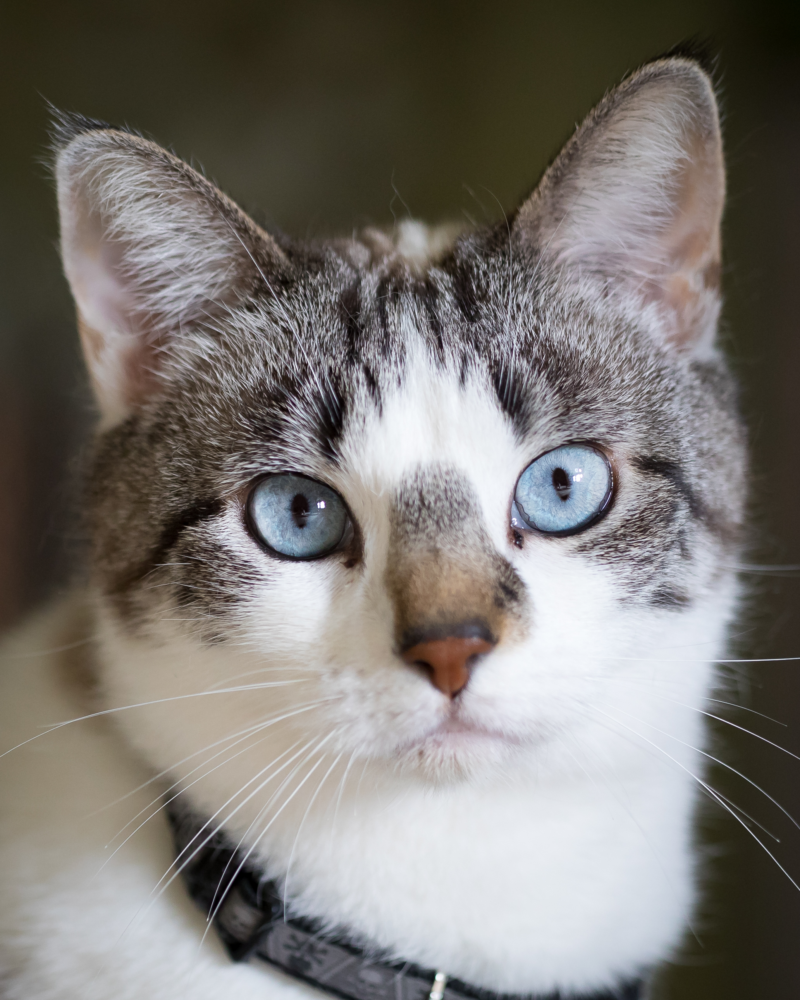

Imagen procesada->deprocesada (reescaleo):


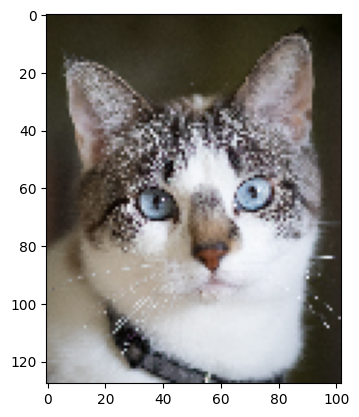

In [96]:
example_img = ImageLoader(url=content_urls['gato1'], img_nrows=128)
print("Imagen original:")
example_img.display_image()
example_img.preprocess_image()
deprocessed_img = example_img.deprocess_image()
print("Imagen procesada->deprocesada (reescaleo):")
plt.imshow(deprocessed_img)

## Parte 1: Que aprende una red convolucional?

Empecemos mirando lo más fácil: veamos los mapas de activación de distintas capas

In [97]:
# Creo un modelo vgg
model = vgg19.VGG19(weights="imagenet", input_shape=(example_img.img_nrows, example_img.img_ncols, 3), include_top=False)
model.summary()

Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)     │ (None, 128, 102, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 128, 102, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 128, 102, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 64, 51, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 64, 51, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 64, 51, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 32, 25, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 32, 25, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 32, 25, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 32, 25, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 32, 25, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 16, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 16, 12, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 16, 12, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 16, 12, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 16, 12, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 8, 6, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 8, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 8, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 8, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 8, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 3, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 20,024,384 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

Activaciones de la capa block1_conv1


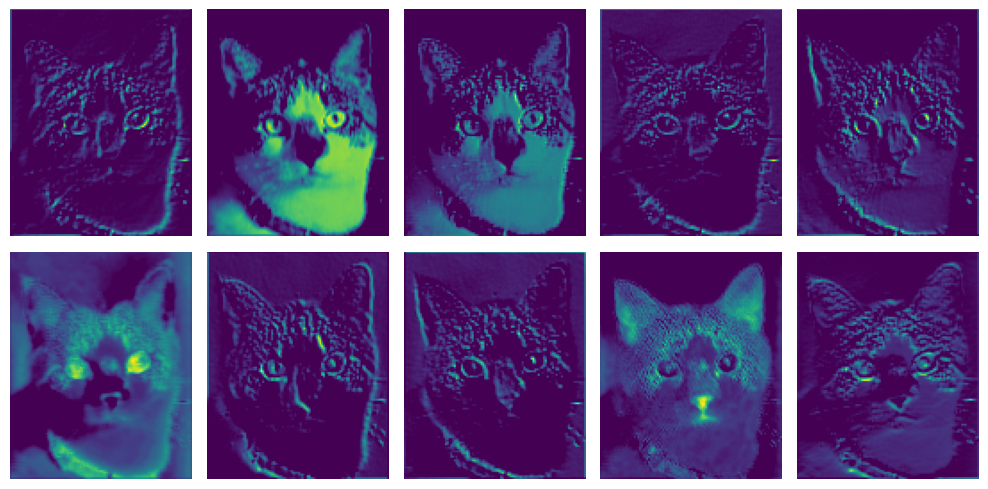

Activaciones de la capa block1_conv2


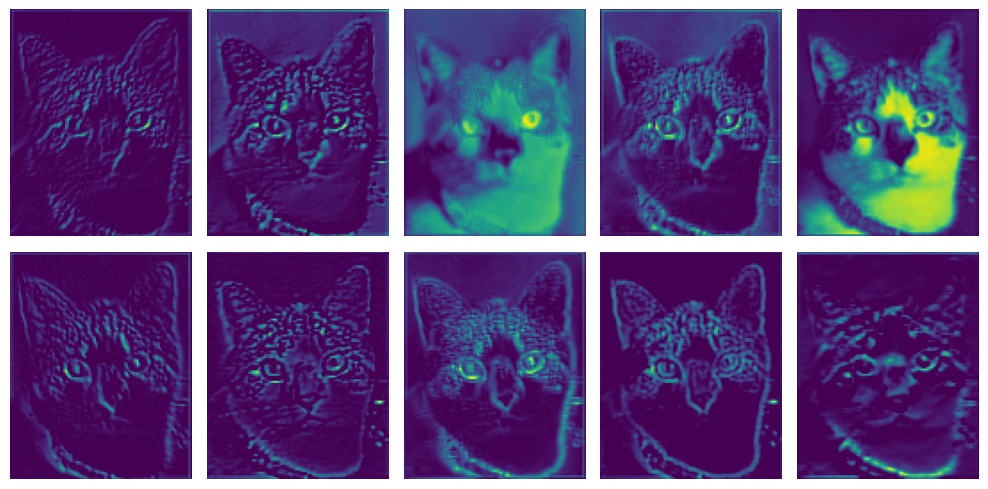

Activaciones de la capa block1_pool


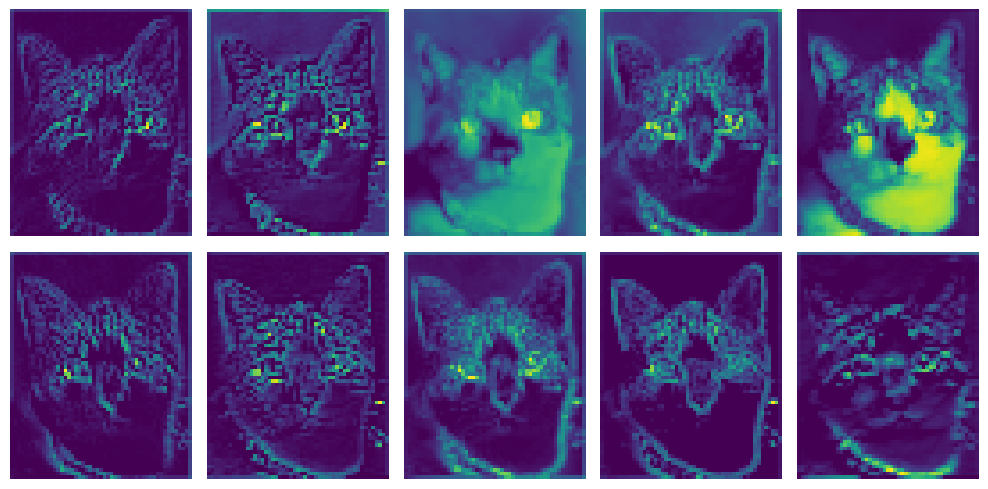

Activaciones de la capa block2_conv1


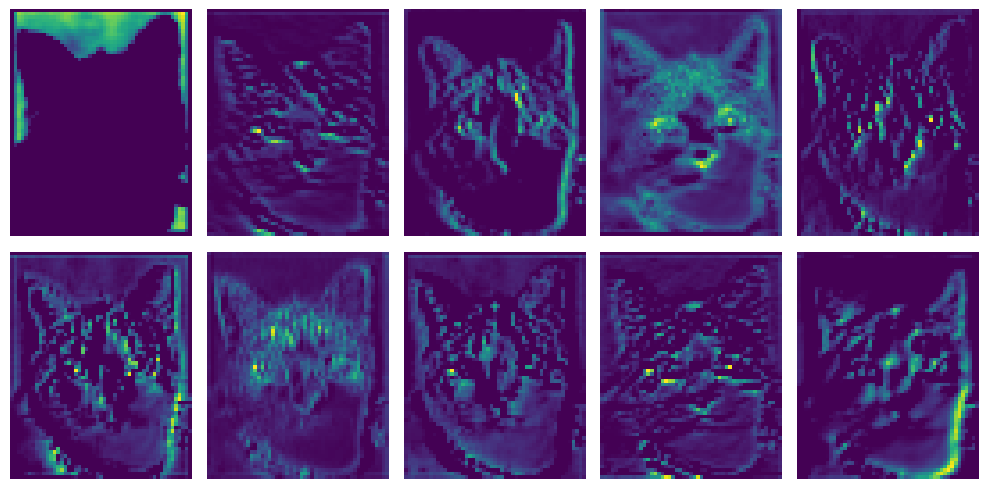

Activaciones de la capa block2_pool


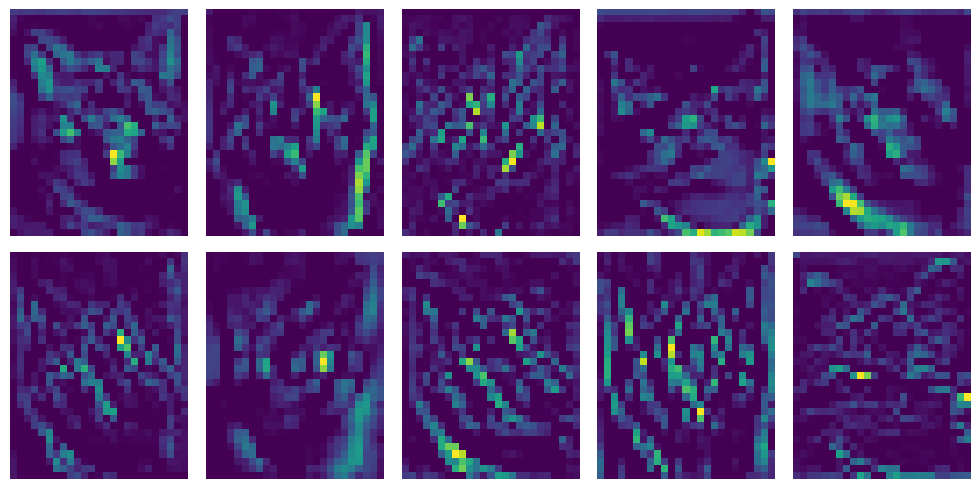

Activaciones de la capa block3_conv1


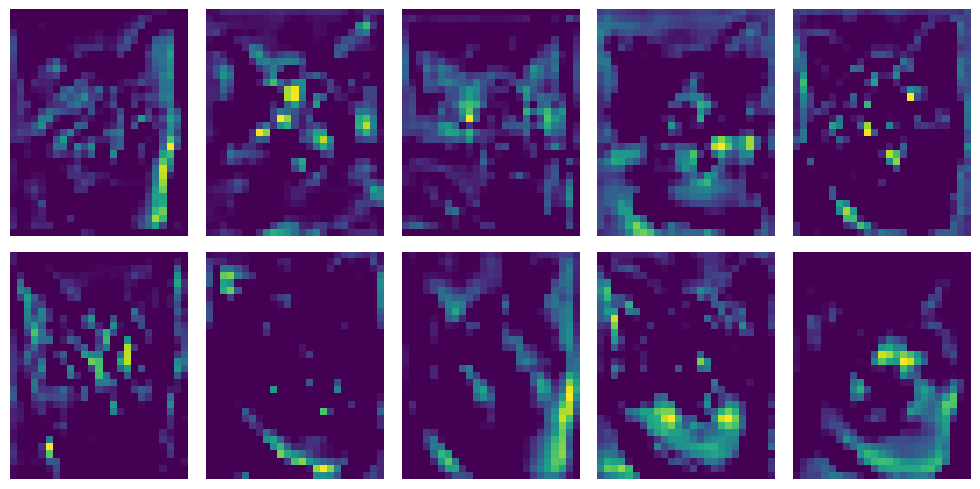

Activaciones de la capa block3_pool


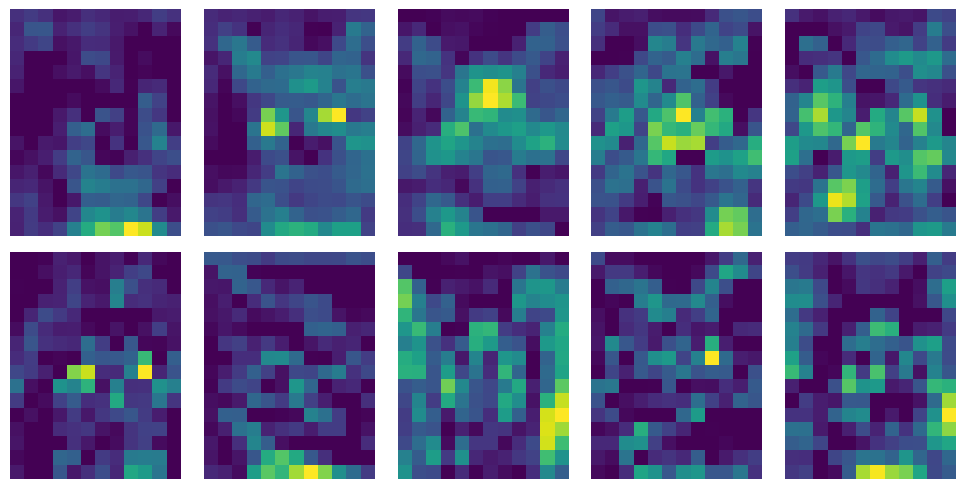

Activaciones de la capa block4_conv1


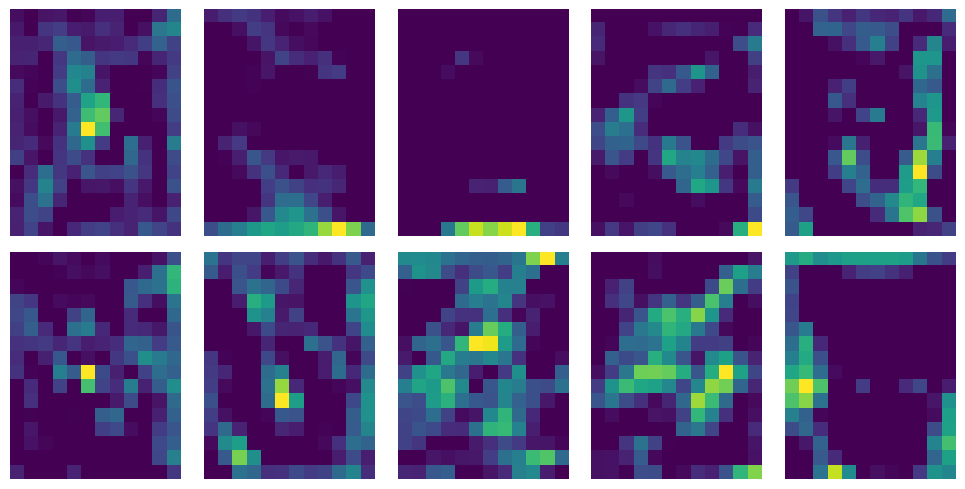

Activaciones de la capa block4_pool


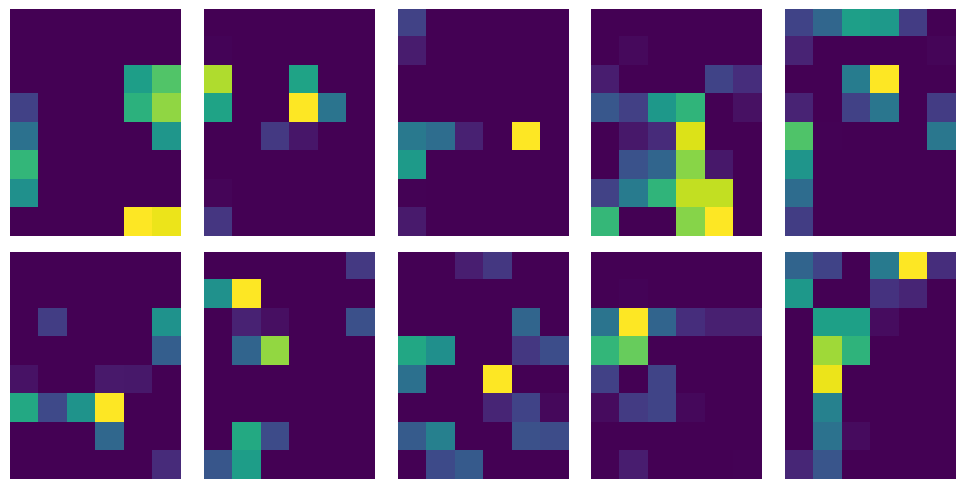

Activaciones de la capa block5_conv1


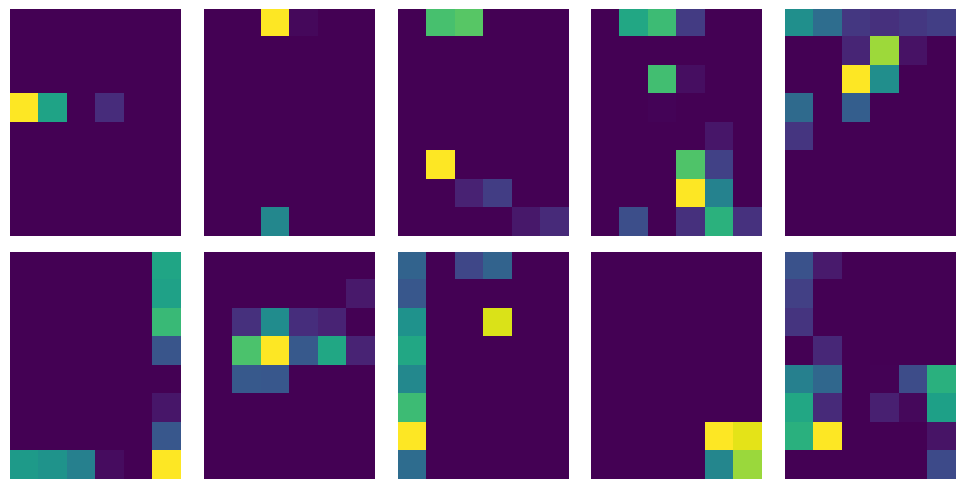

Activaciones de la capa block5_pool


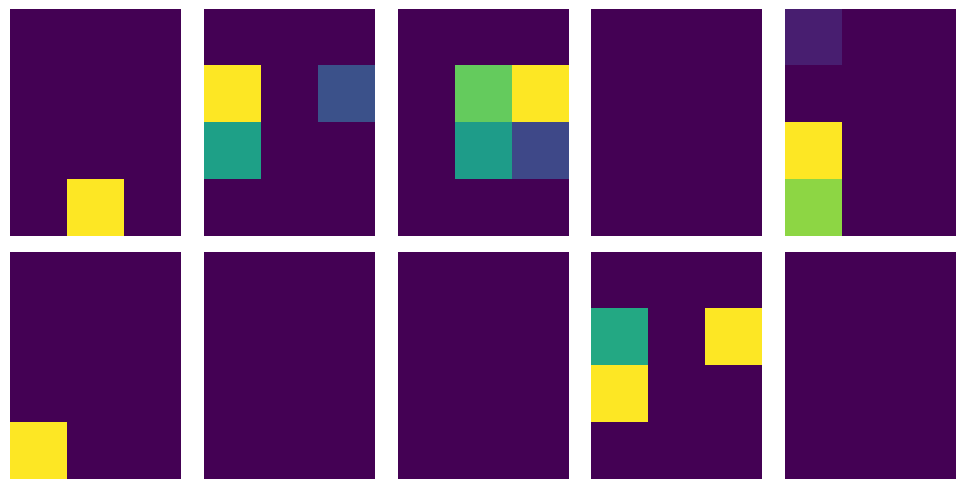

In [98]:
# Creo un modelo que me devuelve las activaciones de las capas que quiero
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

# Quiero ver la activacion de las capas convolucionales y algunas de maxpooling
layer_names = ["block1_conv1", "block1_conv2", "block1_pool", "block2_conv1", "block2_pool", "block3_conv1", "block3_pool", "block4_conv1", "block4_pool", "block5_conv1", "block5_pool"]

# Cargo la imagen
image = ImageLoader(url=content_urls['gato1'], img_nrows=128)
image.preprocess_image()

# Calculo las activaciones de las capas convolucionales
content_features = feature_extractor(image.processed_img)

# Visualizo las activaciones de las capas convolucionales
for layer_name in layer_names:
    print(f"Activaciones de la capa {layer_name}")
    plt.figure(figsize=(10, 5))
    for i in range(10):
        plt.subplot(2, 5, i + 1)
        plt.imshow(content_features[layer_name][0, :, :, i])
        plt.axis("off")
        plt.tight_layout()
    plt.show()

Vemos que los primeros filtros se activan con distintas cosas de la imagen, a saber: líneas, algún color, etc.

Los filtros de más adelante no se entiende que están mirando. Quizás detectan algo más complejo?
 
Podemos estudiar esto empezando con una imagen con ruido y haciendo gradient ascent para modificar los píxeles de la imagen de manera tal que maximicen la activación de algún filtro

In [293]:
## Algunos parametros y funciones:
# Tamaño de la imagen ruidosa
img_width = 128
img_height = 128

# Creo una imagen con ruido
def create_noisy_image():
    img = RandomImage(img_nrows=img_width, img_ncols=img_height)
    return img

# Funcion de loss que quiero maximizar: Valor medio de la activacion de una capa
def activation_loss(input_img, layer_name, kernel_idx, feature_extractor):
    activations = feature_extractor(input_img)
    activation = activations[layer_name][:, 2:-2, 2:-2, kernel_idx]
    return tf.reduce_mean(activation)

# Funcion de gradient ascent que maximiza la activacion de una capa modificando la imagen
def gradient_ascent_step(img, layer_name, kernel_idx, feature_extractor, learning_rate=0.01):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = activation_loss(img, layer_name, kernel_idx, feature_extractor)
    grads = tape.gradient(loss, img)
    grads = tf.math.l2_normalize(grads)
    img += learning_rate * grads
    return img

def max_kernel_activation(layer_name, kernel_idx, feature_extractor, n_its=1000, learning_rate=100, savefile=False):
    img = create_noisy_image()
    img.preprocess_image()
    for i in range(n_its):
        img.processed_img = gradient_ascent_step(img.processed_img, layer_name, kernel_idx, feature_extractor, learning_rate)
    
    img = img.deprocess_image()
    if savefile:
        plt.imsave(f"max_kernels/kernel_{layer_name}_{kernel_idx}.png", img)

Loss: 167437.203125


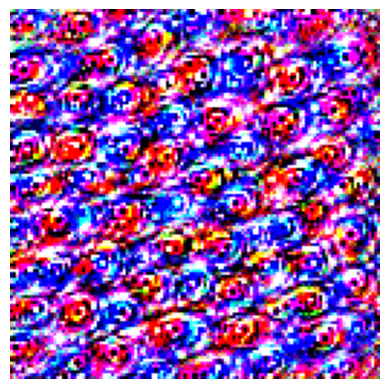

In [295]:
# probemos con la capa block1_conv1
model = vgg19.VGG19(weights="imagenet", input_shape=(img_width, img_height, 3), include_top=False)
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)
img = create_noisy_image()
img.preprocess_image()

layer_name = "block4_conv1"
kernel_idx = 4
learning_rate_value = 100

for i in range(1000):
    img.processed_img = gradient_ascent_step(img.processed_img, layer_name, kernel_idx, feature_extractor, learning_rate=learning_rate_value)
    if i % 10 == 0:
        print(f"Loss: {activation_loss(img.processed_img, layer_name, kernel_idx, feature_extractor)}")
        # Show deprocessed img
        deprocessed = img.deprocess_image()
        plt.imshow(deprocessed)
        plt.axis("off")
        plt.show()
        clear_output(wait=True)

Funciona! Corramos esto para varias layers/kernels

In [315]:
layer_names = ["block1_conv1", "block2_conv1", "block3_conv1", "block4_conv1", "block5_conv1"]
# for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']:
for layer_name in layer_names:
    for kernel_idx in range(5, 10):
        max_kernel_activation(layer_name, kernel_idx, feature_extractor, n_its=1000, learning_rate=100, savefile=True)

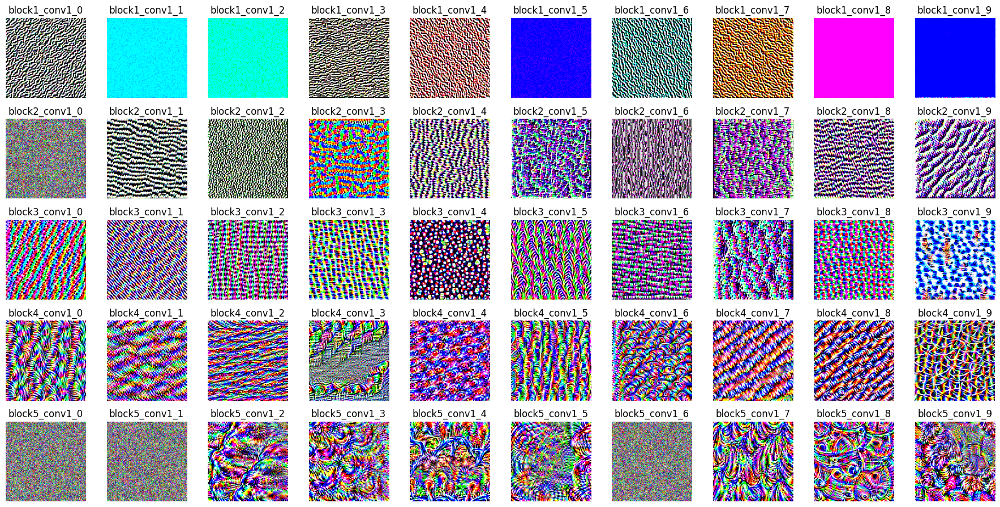

In [321]:
# Voy a visualizar las imagenes que maximizan la activacion de los kernels
n=10
plt.figure(figsize=(18, 18))
for i, file_name in enumerate(layer_names):
    for j in range(n):
        plt.subplot(n, n, i*n + j + 1)
        img = PIL.Image.open(f"max_kernels/kernel_{file_name}_{j}.png")
        plt.title(f"{file_name}_{j}")
        plt.imshow(img)
        plt.axis("off")
plt.tight_layout()

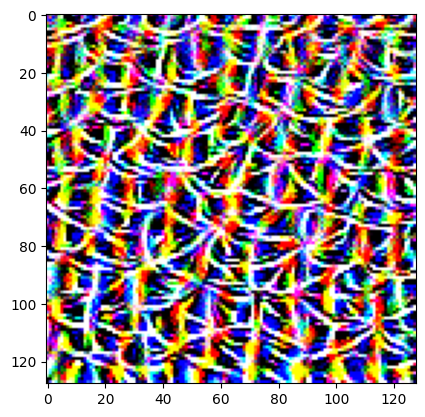

In [332]:
img = PIL.Image.open(f"max_kernels/kernel_block4_conv1_9.png")
plt.imshow(img)